In [33]:
import json
import os
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import seaborn as sns
import torch
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

from batch.data_transforms.db_with_limits import db_with_limits
from batch.label_transforms.refine_label_boundary import refine_label_boundary
from data.data_reader import DataReaderZarr

plt.rcParams["axes.grid"] = False


def plot_loss_and_lr(log_file_path):
    epochs, train_losses, learning_rates = zip(*[
        (data['epoch'], data['train_loss'], data['train_lr'])
        for line in open(log_file_path, 'r')
        if (data := json.loads(line, strict=False), 'train_loss' in data and 'train_lr' in data)
    ])

    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax1.plot(epochs, train_losses, label='Train Loss', marker='o', color='blue', markersize=3)
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Train Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    ax2 = ax1.twinx()
    ax2.plot(epochs, learning_rates, label='Learning Rate', marker='s', color='green', markersize=3)
    ax2.set_ylabel('Learning Rate', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper right')

    plt.title('Training Loss and Learning Rate Over Epochs')
    plt.grid(True)
    plt.show()
    
def process_data(features):
    # Updating Sandeel Seabed and Other Seabed Values
    features[1].replace({'other_seabed': 'other', 'sandeel_seabed': 'sandeel', 'seabed': 'background'}, inplace=True)
    features.reset_index(drop=True, inplace=True)


    value = min(features[1].value_counts().get('other', 0), features[1].value_counts().get('sandeel', 0))

    # Undersampling for Class Balance
    np.random.seed(1)
    features = features.groupby(1, group_keys=False).apply(lambda x: x.sample(min(value, len(x)), replace=False))

    filtered_df = features[~features[1].isin(['other_seabed', 'sandeel_seabed', 'sandeel_other', 'sandeel_other_seabed'])]
    features = filtered_df.reset_index(drop=True)
    features.dropna(inplace=True)
    features = features.reset_index(drop=True)
    return features


def ml_evaluation(features, plot=True, print_output=True, kNN_neighbors=15):
    results = {}

    # kNN
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=kNN_neighbors, metric='euclidean')
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    if print_output: print(f'kNN Accuracy = {accuracy * 100}')
    results['Accuracy (kNN)'] = accuracy * 100

    cm = confusion_matrix(y_test, y_pred)
    if print_output:
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=features[1].unique(), yticklabels=features[1].unique())
        plt.title('Confusion Matrix for kNN')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X)
    X_test_pca = pca.transform(X_test)
    fig = go.Figure()
    for label in features.iloc[:, 1].unique():
        indices = (y == label)
        fig.add_trace(go.Scatter3d(
            x=X_pca[indices, 0],
            y=X_pca[indices, 1],
            z=X_pca[indices, 2],
            mode='markers',
            name=label,
            marker=dict(size=1, symbol='circle')
        ))
    fig.update_layout(
        scene=dict(
            xaxis_title='Principal Component 1',
            yaxis_title='Principal Component 2',
            zaxis_title='Principal Component 3'
        ),
        title='Interactive 3D Scatter Plot of Test Set Predictions for kNN',
        legend=dict(x=0, y=1.0),
        width=800,
        height=600,
    )
    if plot:
        fig.show()

    # Multinomial Logistic Regression
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 1]
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.20, stratify=y_encoded, random_state=42)
    logreg_multinomial = LogisticRegression(solver='saga', multi_class='multinomial', C=100, max_iter=500)
    logreg_multinomial.fit(X_train, y_train)
    y_pred_prob = logreg_multinomial.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(label_encoder.classes_)):
        fpr[i], tpr[i], _ = roc_curve((y_test == i).astype(int), y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        results[f'AUC class {i} (Logistic Regression)'] = roc_auc[i]

    macro_auc = np.mean(list(roc_auc.values()))
    results['Macro AUC (Logistic Regression)'] = macro_auc

    if print_output:
        print("Multinomial Logistic Regression Macro Average AUC:", macro_auc)
        plt.figure(figsize=(8, 6))
        for i in range(len(label_encoder.classes_)):
            plt.plot(fpr[i], tpr[i], label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curves for each Class - Multinomial Logistic Regression')
        plt.legend(loc="lower right")
        plt.show()

    # Linear Classifier on Mean Sv
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 9]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results['RMSE (Linear Regression, Mean Sv)'] = rmse
    r2 = r2_score(y_test, y_pred)
    results['R2 (Linear Regression, Mean Sv)'] = r2
    mae = mean_absolute_error(y_test, y_pred)
    results['MAE (Linear Regression, Mean Sv)'] = mae

    if print_output:
        print(f'Root Mean Squared Error (RMSE) on the test set for Linear Classifier on Mean Sv: {rmse:.2f}')
        print(f'R-squared on the test set for Linear Classifier on Mean Sv: {r2:.2f}')
        print(f'Mean Absolute Error (MAE) on the test set for Linear Classifier on Mean Sv: {mae:.2f}')
        plt.figure(figsize=(8, 6))
        plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
        plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
        plt.title('Predicted vs. Actual Values - Linear Classifier on Mean Sv')
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.legend()
        plt.show()

    # Linear Classifier on Number of Sandeel Pixels
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 7]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results['RMSE (Linear Regression, Number of Sandeel Pixels)'] = rmse
    r2 = r2_score(y_test, y_pred)
    results['R2 (Linear Regression, Number of Sandeel Pixels)'] = r2
    mae = mean_absolute_error(y_test, y_pred)
    results['MAE (Linear Regression, Number of Sandeel Pixels)'] = mae

    if print_output:
        print(f'Root Mean Squared Error (RMSE) on the test set for Linear Classifier on Number of Sandeel Pixels: {rmse:.2f}')
        print(f'R-squared on the test set for Linear Classifier on Number of Sandeel Pixels: {r2:.2f}')
        print(f'Mean Absolute Error (MAE) on the test set for Linear Classifier on Number of Sandeel Pixels: {mae:.2f}')
        plt.figure(figsize=(8, 6))
        plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
        plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
        plt.title('Predicted vs. Actual Values - Linear Classifier on Number of Sandeel Pixels')
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.legend()
        plt.show()

    # Linear Regression on Number of Sandeel Pixels: Only on Sandeel Patches Data
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 7]
    zero_indices = y[y == 0].index
    random_indices = np.random.choice(zero_indices, size=0, replace=False)
    non_zero_indices = y[y != 0].index
    selected_indices = np.concatenate([random_indices, non_zero_indices])
    X_selected = X.loc[selected_indices]
    y_selected = y.loc[selected_indices]
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.20, random_state=42)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results['RMSE (Linear Regression, Number of Sandeel Pixels on Sandeel Patches)'] = rmse
    r2 = r2_score(y_test, y_pred)
    results['R2 (Linear Regression, Number of Sandeel Pixels on Sandeel Patches)'] = r2
    mae = mean_absolute_error(y_test, y_pred)
    results['MAE (Linear Regression, Number of Sandeel Pixels on Sandeel Patches)'] = mae

    if print_output:
        print(f'Root Mean Squared Error (RMSE) on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): {rmse:.2f}')
        print(f'R-squared on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): {r2:.2f}')
        print(f'Mean Absolute Error (MAE) on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): {mae:.2f}')
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
        plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
        plt.title('Predicted vs. Actual Values - Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data)')
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.legend()
        plt.subplot(1, 3, 2)
        plt.hist(y_train, bins=30, color='blue', alpha=0.7)
        plt.title('Histogram of y_train Distribution')
        plt.xlabel('y_train')
        plt.ylabel('Frequency')
        plt.subplot(1, 3, 3)
        plt.hist(y_test, bins=30, color='green', alpha=0.7)
        plt.title('Histogram of y_test Distribution')
        plt.xlabel('y_test')
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()

    summary_table = pd.DataFrame.from_dict(results, orient='index', columns=['Value'])
    return summary_table



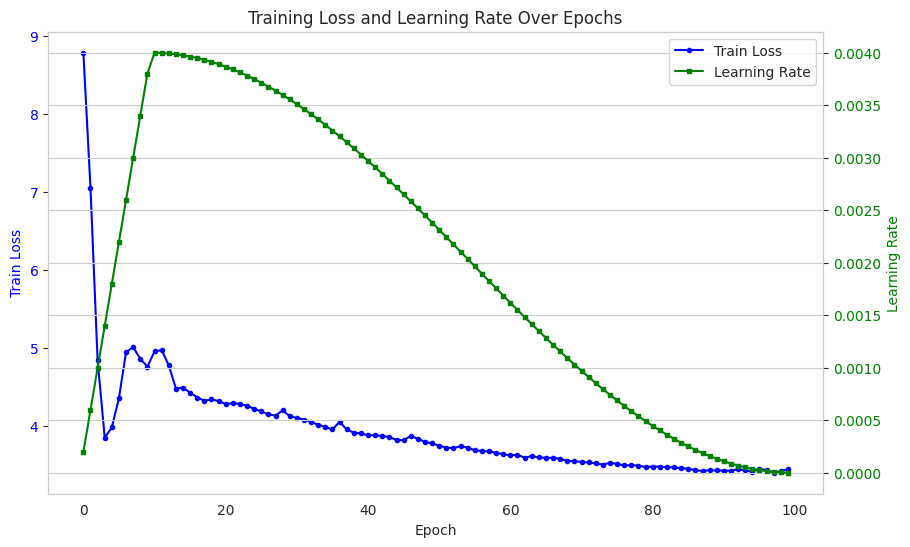

In [4]:
plot_loss_and_lr('/scratch/disk5/ahmet/dino_output/100ep_acoustics_8w_YENI_Intensity_Based_9_TrainSurveys_NEAREST_ResNet18Modified_128NONNormalized_8192Out_FixAug_2048Batch_FixedData(NoBlur)/log.txt')

In [48]:

# Model 31 (Random Sampling)
#features = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/Model31_2017_8w.csv', header=None, sep=r',|\t', engine='python')

# Model 33 (Intensity-Based Sampling)
#features = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/Model33_2017_8w.csv', header=None, sep=r',|\t', engine='python')

# Model 25 (Balanced Sampling)
features = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/Model25_2017_8w.csv', header=None, sep=r',|\t', engine='python')


# Predicting for One Feature Data

kNN Accuracy = 77.55915016900047


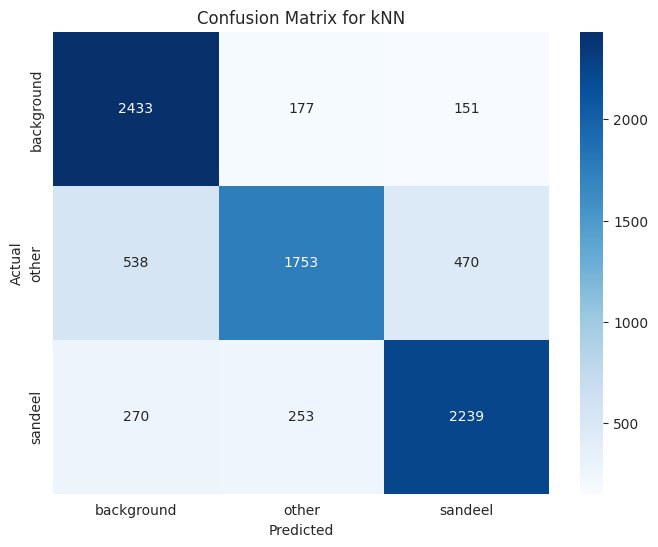

Multinomial Logistic Regression Macro Average AUC: 0.9230158325428306


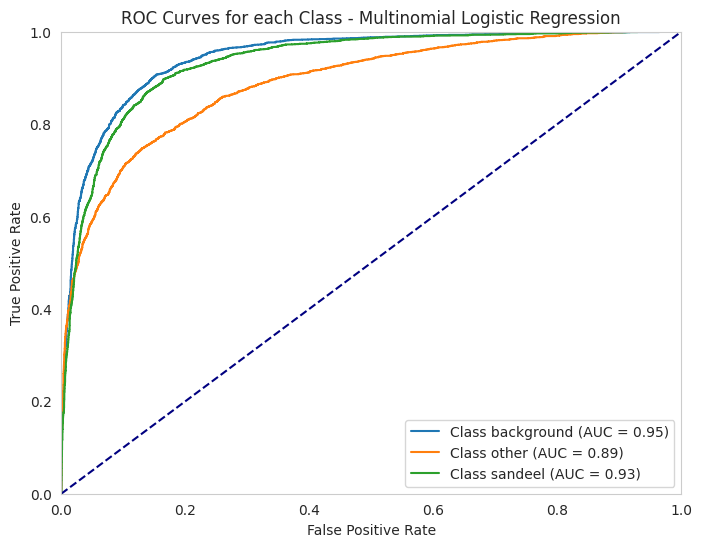

Root Mean Squared Error (RMSE) on the test set for Linear Classifier on Mean Sv: 2.40
R-squared on the test set for Linear Classifier on Mean Sv: 0.95
Mean Absolute Error (MAE) on the test set for Linear Classifier on Mean Sv: 1.71


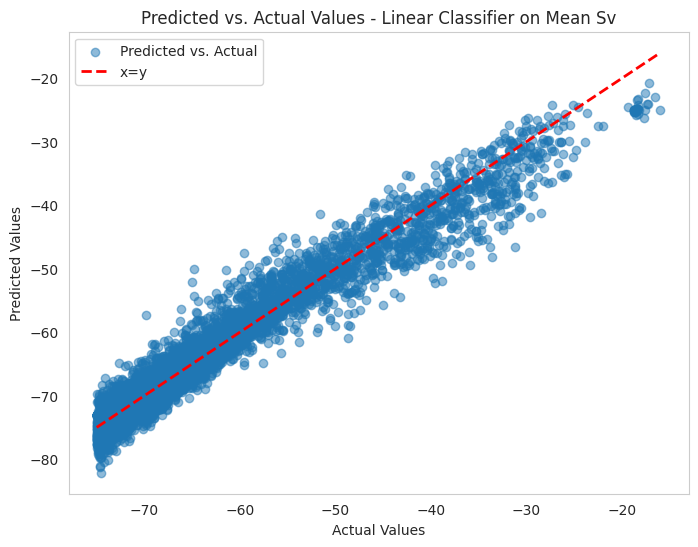

Root Mean Squared Error (RMSE) on the test set for Linear Classifier on Number of Sandeel Pixels: 10.28
R-squared on the test set for Linear Classifier on Number of Sandeel Pixels: 0.68
Mean Absolute Error (MAE) on the test set for Linear Classifier on Number of Sandeel Pixels: 6.68


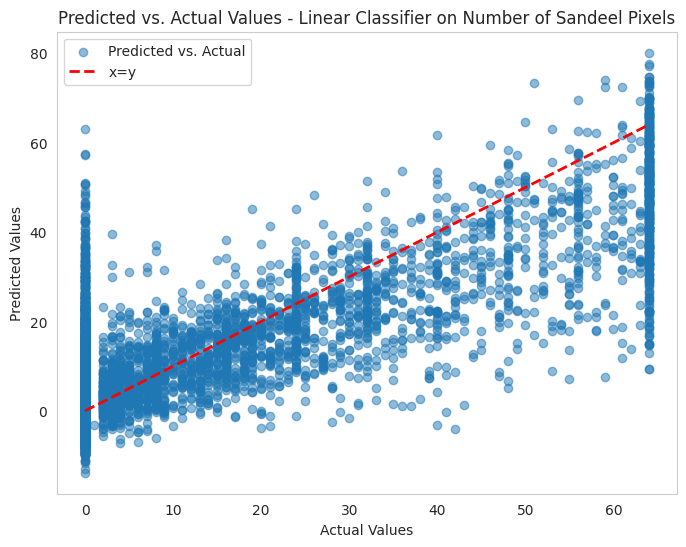

Root Mean Squared Error (RMSE) on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): 10.25
R-squared on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): 0.77
Mean Absolute Error (MAE) on the test set for Linear Regression on Number of Sandeel Pixels (Sandeel Patches Data): 7.15


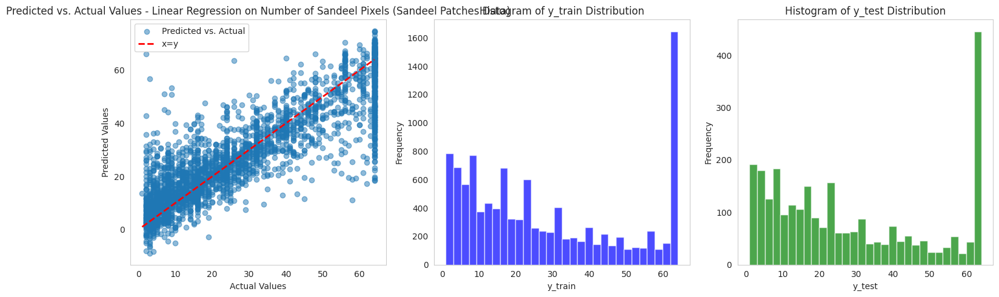

,Value
Accuracy (kNN),77.559150
AUC class 0 (Logistic Regression),0.945303
AUC class 1 (Logistic Regression),0.889517
AUC class 2 (Logistic Regression),0.934227
Macro AUC (Logistic Regression),0.923016
"RMSE (Linear Regression, Mean Sv)",2.400133
"R2 (Linear Regression, Mean Sv)",0.949133
"MAE (Linear Regression, Mean Sv)",1.714266
"RMSE (Linear Regression, Number of Sandeel Pixels)",10.280072
"R2 (Linear Regression, Number of Sandeel Pixels)",0.681486


In [54]:
ml_evaluation(process_data(features), print_output=True, plot=True, kNN_neighbors=25)

In [ ]:
# Multiple Run for varying k values in kNN
def kNN_multiple_run(features, print_output=True, kNN_neighbors=15):
    results = {}

    # kNN
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=kNN_neighbors, metric='euclidean')
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    if print_output: print(f'kNN Accuracy = {accuracy * 100}')
    results['Accuracy (kNN)'] = accuracy * 100
    #print(f'k = {kNN_neighbors}, accuracy = {accuracy}')
    print(accuracy)
    return accuracy    
    
for k in [5,10,15,20,25,30,35,40,45,50]:
    kNN_multiple_run(process_data(features), print_output=False, kNN_neighbors=k)


In [ ]:
# Multiple Run for varying seed values in Multinomial logistic regression
def multi_logreg_run(features, C_value=100):
    results = {}

    # Multinomial Logistic Regression
    X = features.iloc[:, 11:139]
    y = features.iloc[:, 1]
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.20, stratify=y_encoded, random_state=42)
    logreg_multinomial = LogisticRegression(solver='saga', multi_class='multinomial', C=C_value, max_iter=500)
    logreg_multinomial.fit(X_train, y_train)
    y_pred_prob = logreg_multinomial.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(label_encoder.classes_)):
        fpr[i], tpr[i], _ = roc_curve((y_test == i).astype(int), y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        results[f'AUC class {i} (Logistic Regression)'] = roc_auc[i]

    macro_auc = np.mean(list(roc_auc.values()))
    print(macro_auc)
    return macro_auc

for C_value in [1,5,40,70,100,200,500,1000,1500,2000]:
    multi_logreg_run(process_data(features), C_value=C_value)


# Predicting for series of Feature Datasets

In [9]:
def process_csv(file_path, model_number):
    features = process_data(pd.read_csv(file_path, header=None, sep=r',|\t', engine='python'))
    results = ml_evaluation(features, print_output=False, plot=False)
    results.columns = [model_number]
    return results

directory = '/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/'

start_number = 1
end_number = 34

concatenated_results = None

progress_bar = tqdm(range(start_number, end_number + 1), desc="Processing CSVs")

for i in progress_bar:
    csv_file = f"Model{i}_2017_8w.csv"
    file_path = os.path.join(directory, csv_file)
    model_number = f"Model{i}_2017_8w"
    results = process_csv(file_path, model_number)
    if concatenated_results is None:
        concatenated_results = results
    else:
        concatenated_results = pd.concat([concatenated_results, results], axis=1)

concatenated_results


Processing CSVs:   3%|▎         | 1/34 [01:16<42:16, 76.86s/it]


FileNotFoundError: [Errno 2] No such file or directory: '/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/Model2_2017_8w.csv'

# Additional Computations  

In [11]:
features = process_data(features)

Accuracy: 77.55%
Confusion Matrix:
[[2431  175  155]
 [ 508 1735  518]
 [ 266  238 2258]]


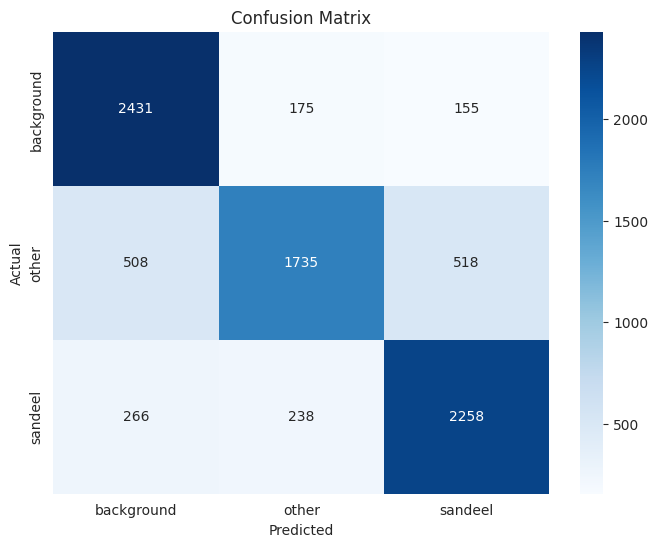

In [12]:
# kNN

X = features.iloc[:, 11:139]
y = features.iloc[:, 1]  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean')
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)


y_pred = knn.predict(X_test)

misclassified_samples = X_test[y_test != y_pred]
misclassified_real_classes = y_test[y_test != y_pred]
misclassified_predicted_classes = y_pred[y_test != y_pred]

misclassified_indices = X_test.index[y_test != y_pred]

original_rows = features.iloc[misclassified_indices, :].copy()
original_rows.insert(0, 'Predicted Class', misclassified_predicted_classes)


correctly_classified_indices = X_test.index[y_test == y_pred]
correctly_classified_original_rows = features.iloc[correctly_classified_indices, :].copy()
correctly_classified_original_rows.insert(0, 'Predicted Class', y_pred[y_test == y_pred])


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=features[1].unique(), yticklabels=features[1].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)


X_test_pca = pca.transform(X_test)


fig = go.Figure()
for label in features.iloc[:, 1].unique():
    indices = (y_test == label)
    fig.add_trace(go.Scatter3d(
        x=X_test_pca[indices, 0],
        y=X_test_pca[indices, 1],
        z=X_test_pca[indices, 2],
        mode='markers',
        name=label,
        marker=dict(size=2, symbol='circle')
    ))


fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    title='Interactive 3D Scatter Plot of Test Set Predictions',
    legend=dict(x=0, y=1.0),
    width=800, 
    height=600, 
)
fig.show()

In [6]:
features

,0,1,2,3,4,5,6,7,8,9,...,130,131,132,133,134,135,136,137,138,139
0,32553,background,2017,108,683660,background,0,0,0,-70.413610,...,0.150072,0.140128,0.000000,0.000000,0.169245,0.029624,0.016908,0.167455,0.000000,del
1,110637,background,2017,244,755476,seabed,0,0,37,-44.470948,...,0.049916,0.000092,0.015515,0.067110,0.028030,0.087200,0.000000,0.000000,0.116459,del
2,107170,background,2017,252,531860,seabed,0,0,2,-74.653352,...,0.015919,0.003288,0.038517,0.079948,0.019593,0.085504,0.027599,0.000000,0.131355,del
3,97162,background,2017,308,55588,seabed,0,0,12,-67.204659,...,0.117511,0.023594,0.004933,0.028135,0.171706,0.041485,0.000609,0.000000,0.061058,del
4,121513,background,2017,492,1431444,seabed,0,0,2,-71.070074,...,0.378294,0.035923,0.011319,0.000000,0.184178,0.049340,0.025407,0.054336,0.007899,del
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41413,74484,sandeel,2017,180,1286588,sandeel,0,64,0,-66.796544,...,0.034388,0.004560,0.176094,0.203824,0.155156,0.009038,0.018099,0.078734,0.076008,del
41414,55825,sandeel,2017,108,627308,sandeel,0,64,0,-72.084950,...,0.030719,0.016290,0.082292,0.154480,0.050765,0.066443,0.012168,0.000000,0.107510,del
41415,61901,sandeel,2017,76,77900,sandeel,0,64,0,-62.776441,...,0.000000,0.000000,0.160663,0.237771,0.219593,0.029159,0.048288,0.008712,0.019118,del
41416,80479,sandeel,2017,68,677164,sandeel,0,54,0,-71.615718,...,0.068687,0.013205,0.071328,0.115957,0.085068,0.061840,0.005232,0.000000,0.101033,del


# Visualizing Misclassified Patch Statistics

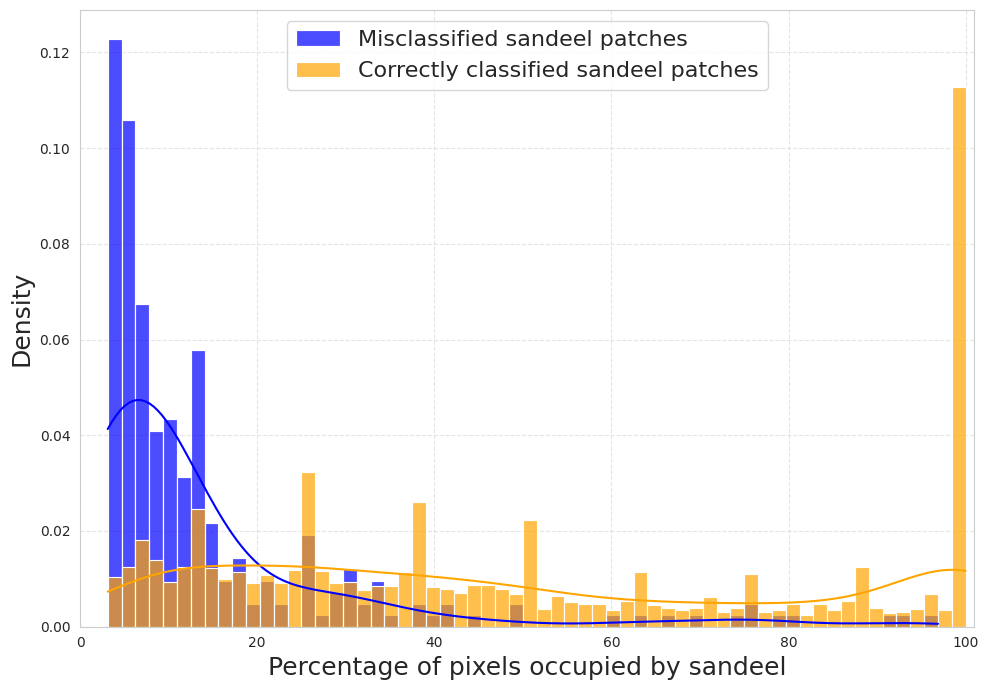

In [13]:
# Final Visualization

sandeel_as_background = original_rows[(original_rows['Predicted Class'] == 'background') & (original_rows.iloc[:, 2] == 'sandeel')]
sandeel_as_sandeel = correctly_classified_original_rows[(correctly_classified_original_rows['Predicted Class'] == 'sandeel') & (correctly_classified_original_rows.iloc[:, 2] == 'sandeel')]

common_bin_width = 1

bins_background = int((sandeel_as_background[7].max() - sandeel_as_background[7].min()) / common_bin_width)
bins_sandeel = int((sandeel_as_sandeel[7].max() - sandeel_as_sandeel[7].min()) / common_bin_width)

plt.figure(figsize=(10, 7))

percentages_pixelbased_mis = 100 * sandeel_as_background[sandeel_as_background[7] > 0][7] / sandeel_as_background[sandeel_as_background[7] > 0][10]
percentages_pixelbased_cor = 100 * sandeel_as_sandeel[7] / sandeel_as_sandeel[10]

sns.histplot(percentages_pixelbased_mis, bins=bins_background, color='blue', alpha=0.7, label='Misclassified sandeel patches', kde=True, stat='density')
sns.histplot(percentages_pixelbased_cor, bins=bins_sandeel, color='orange', alpha=0.7, label='Correctly classified sandeel patches', kde=True, stat='density')

plt.xlabel('Percentage of pixels occupied by sandeel', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.xlim(0, 101)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(fontsize=16)

plt.tight_layout()

plt.savefig('misclassified_patches_histogram_model33_NEW.png', dpi=600)
plt.show()


Macro Average AUC: 0.9232955099521268


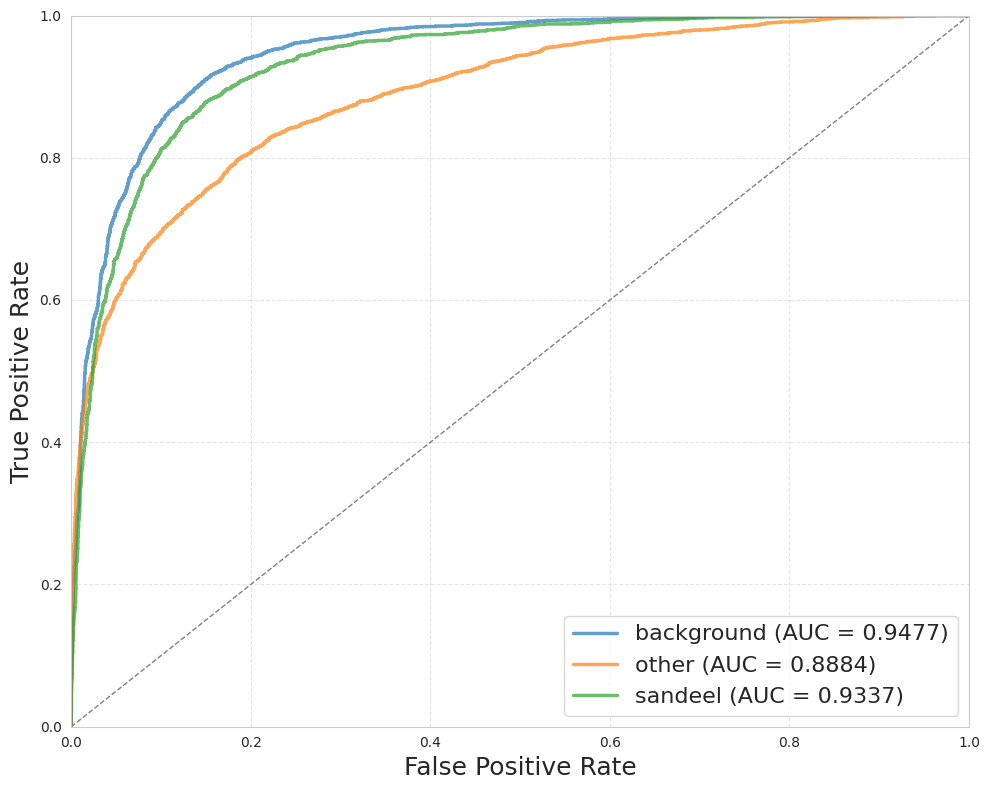

In [14]:
# Multinomial Logistic Regression

X = features.iloc[:, 11:139]#+128+256
y = features.iloc[:, 1]

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.20, stratify=y_encoded, random_state=42)

logreg_multinomial = LogisticRegression(solver='saga', multi_class='multinomial', C=100, max_iter=500)
logreg_multinomial.fit(X_train, y_train)

y_pred_prob = logreg_multinomial.predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(label_encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve((y_test == i).astype(int), y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

macro_auc = np.mean(list(roc_auc.values()))
print("Macro Average AUC:", macro_auc)

# ROC curves for each class
plt.figure(figsize=(10, 8)) 
for i in range(len(label_encoder.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'{label_encoder.classes_[i]} (AUC = {roc_auc[i]:.4f})', 
             linewidth=2.5, alpha=0.7) 

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', linewidth=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate', fontsize=18) 
plt.ylabel('True Positive Rate', fontsize=18)  
plt.legend(loc="lower right", fontsize=16) 
plt.grid(True, linestyle='--', alpha=0.5) 
plt.tight_layout() 
plt.savefig('ROC_model31_NEW', dpi=600)
plt.show()


Root Mean Squared Error (RMSE) on the test set: 1.5088
R-squared on the test set: 0.9799
Mean Absolute Error (MAE) on the test set: 1.0296


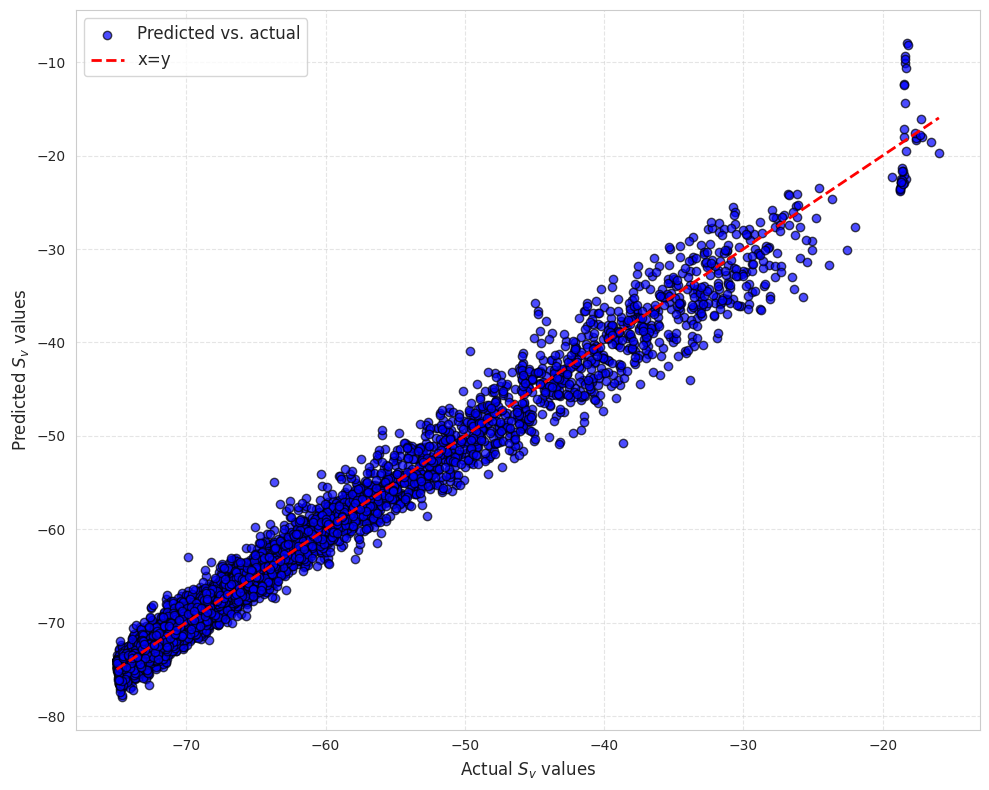

In [15]:
# Linear Classifier on Mean Sv

X = features.iloc[:, 11:139]
y = features.iloc[:, 9]    

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42) #, stratify=y

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

#y_pred = np.maximum(y_pred, 0)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE) on the test set: {rmse:.4f}')

r2 = r2_score(y_test, y_pred)
print(f'R-squared on the test set: {r2:.4f}')

mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE) on the test set: {mae:.4f}')

plt.figure(figsize=(10, 8))  
plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs. actual', color='blue', marker='o', edgecolors='black') 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y') 

plt.xlabel('Actual $S_v$ values', fontsize=12)  
plt.ylabel('Predicted $S_v$ values', fontsize=12)  
plt.legend(fontsize=12)  
plt.grid(True, linestyle='--', alpha=0.5) 
plt.tight_layout() 
plt.savefig('Predicted_vs_Actual_Sv_model33',dpi=600)
plt.show()


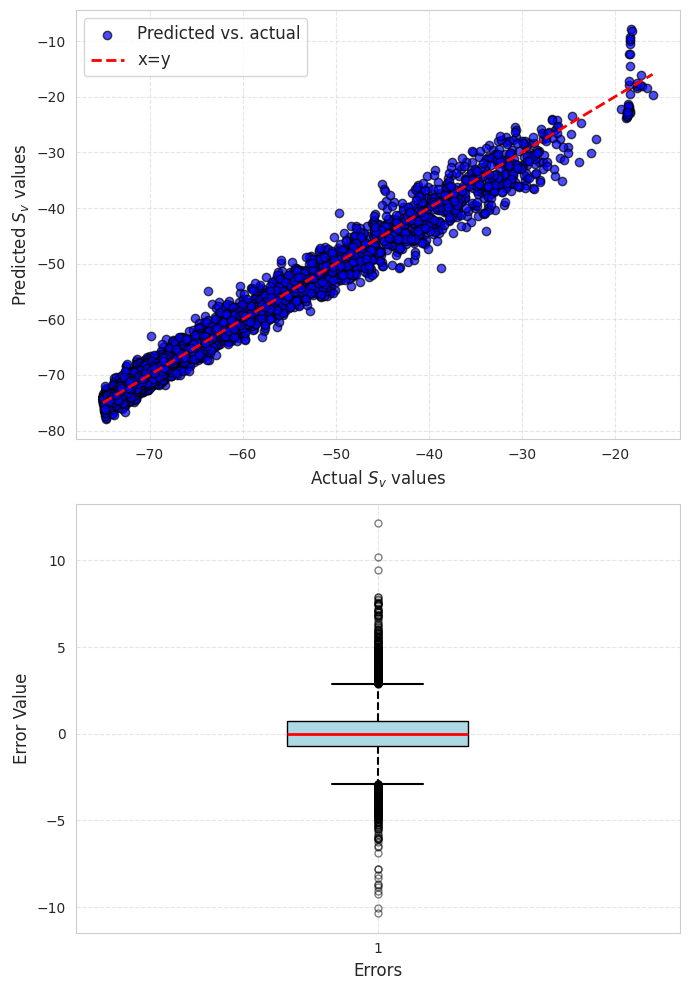

In [16]:
# Plotting both predicted versus actual values and error distribution

errors = y_test - y_pred


plt.figure(figsize=(7, 10))

# Scatter plot (First Row)
plt.subplot(2, 1, 1)
plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs. actual', color='blue', marker='o', edgecolors='black')  
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')  
plt.xlabel('Actual $S_v$ values', fontsize=12)  
plt.ylabel('Predicted $S_v$ values', fontsize=12)  
plt.legend(fontsize=12)  
plt.grid(True, linestyle='--', alpha=0.5)  


plt.subplots_adjust(hspace=2)

plt.subplot(2, 1, 2)
box = plt.boxplot(errors, vert=True, widths=0.3, patch_artist=True, boxprops=dict(facecolor='lightblue', color='black'), whiskerprops=dict(color='black'), medianprops=dict(color='red'))

for whisker in box['whiskers']:
    whisker.set_linestyle('--')
    whisker.set_linewidth(1.5)
for cap in box['caps']:
    cap.set_color('black')
    cap.set_linewidth(1.5)
for median in box['medians']:
    median.set_linewidth(2)
for flier in box['fliers']:
    flier.set(marker='o', color='blue', alpha=0.5, markersize=5)  

plt.xlabel('Errors', fontsize=12)  
plt.ylabel('Error Value', fontsize=12)  
plt.grid(True, linestyle='--', alpha=0.5)  

plt.subplots_adjust(hspace=2)

plt.tight_layout()  
plt.savefig('Combined_Predicted_vs_Actual_Sv_and_Error_model31',dpi=600)
plt.show()


Root Mean Squared Error (RMSE) on the test set: 10.2212
R-squared on the test set: 0.6851
Mean Absolute Error (MAE) on the test set: 6.5183


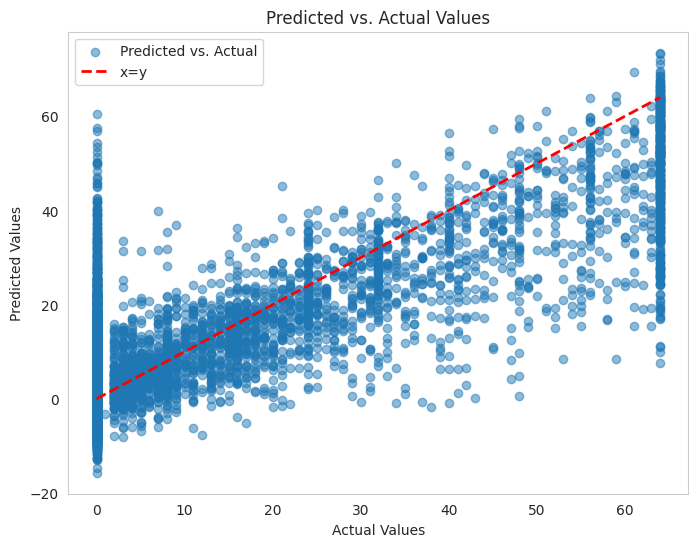

In [17]:
# Linear Classifier on Number of Sandeel Pixels

X = features.iloc[:, 11:139] 
y = features.iloc[:, 7]     

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42) #, stratify=y

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

#y_pred = np.maximum(y_pred, 0)


rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE) on the test set: {rmse:.4f}')

r2 = r2_score(y_test, y_pred)
print(f'R-squared on the test set: {r2:.4f}')

mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE) on the test set: {mae:.4f}')

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
plt.title('Predicted vs. Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


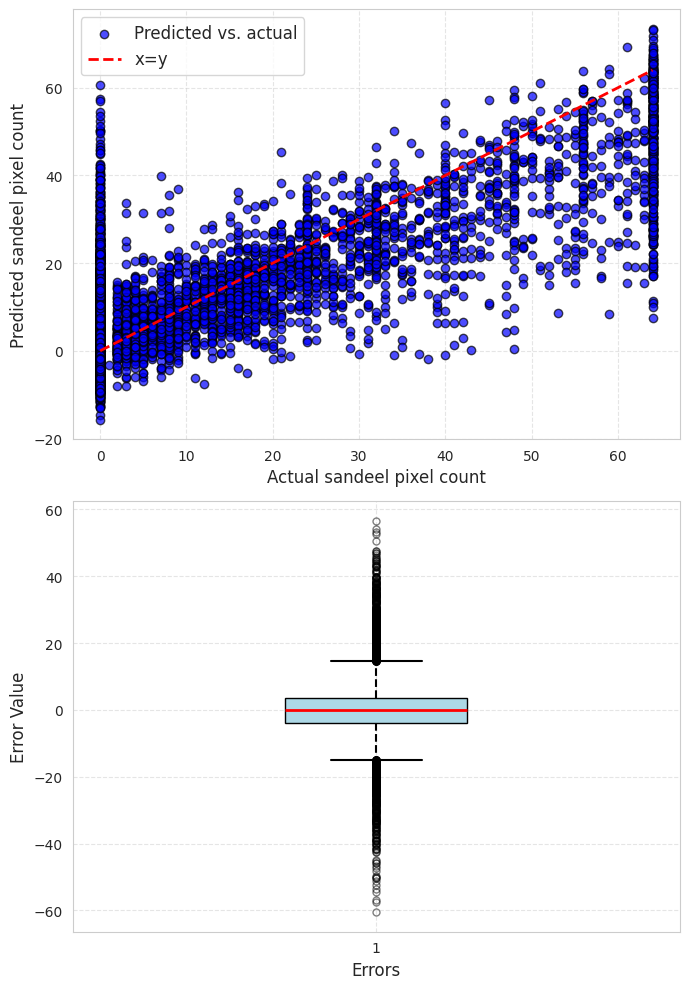

In [18]:

errors = y_test - y_pred


plt.figure(figsize=(7, 10))

plt.subplot(2, 1, 1)
plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs. actual', color='blue', marker='o', edgecolors='black')  
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')  
plt.xlabel('Actual sandeel pixel count', fontsize=12)  
plt.ylabel('Predicted sandeel pixel count', fontsize=12)  
plt.legend(fontsize=12)  
plt.grid(True, linestyle='--', alpha=0.5)  


plt.subplots_adjust(hspace=2)

plt.subplot(2, 1, 2)
box = plt.boxplot(errors, vert=True, widths=0.3, patch_artist=True, boxprops=dict(facecolor='lightblue', color='black'), whiskerprops=dict(color='black'), medianprops=dict(color='red'))

for whisker in box['whiskers']:
    whisker.set_linestyle('--')
    whisker.set_linewidth(1.5)
for cap in box['caps']:
    cap.set_color('black')
    cap.set_linewidth(1.5)
for median in box['medians']:
    median.set_linewidth(2)
for flier in box['fliers']:
    flier.set(marker='o', color='blue', alpha=0.5, markersize=5)  

plt.xlabel('Errors', fontsize=12)  
plt.ylabel('Error Value', fontsize=12)  
plt.grid(True, linestyle='--', alpha=0.5)  

plt.subplots_adjust(hspace=2)

plt.tight_layout()  
plt.savefig('Combined_Predicted_vs_Actual_sandeel_and_Error_model33',dpi=600)
plt.show()


Root Mean Squared Error (RMSE) on the test set: 9.94
R-squared on the test set: 0.79
Mean Absolute Error (MAE) on the test set: 6.82


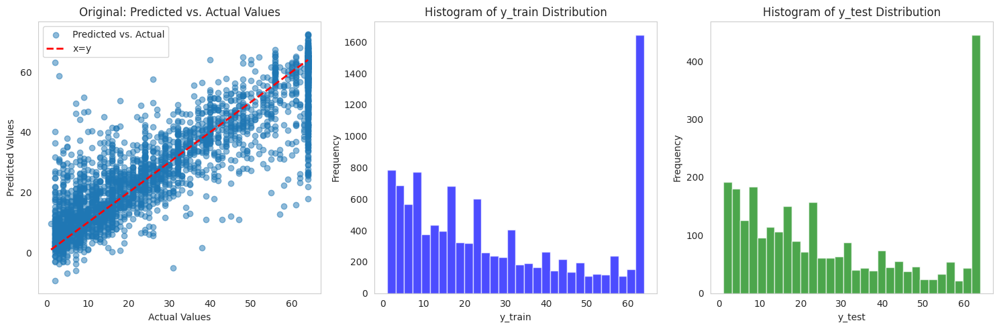

In [19]:
# Linear Regression on Number of Sandeel Pixels: Only on Sandeel Patches Data

np.random.seed(42)

X = features.iloc[:, 11:139] 
y = features.iloc[:, 7]    

zero_indices = y[y == 0].index

random_indices = np.random.choice(zero_indices, size=0, replace=False)

non_zero_indices = y[y != 0].index


selected_indices = np.concatenate([random_indices, non_zero_indices])


X_selected = X.loc[selected_indices]
y_selected = y.loc[selected_indices]

X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.20, random_state=42)

#y_train = np.log10(y_train+1)
#y_test = np.log10(y_test+1)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

#y_pred = np.maximum(y_pred, 0)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE) on the test set: {rmse:.2f}')

r2 = r2_score(y_test, y_pred)
print(f'R-squared on the test set: {r2:.2f}')

mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE) on the test set: {mae:.2f}')

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
plt.title('Original: Predicted vs. Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

plt.subplot(1, 3, 2)
plt.hist(y_train, bins=30, color='blue', alpha=0.7)
plt.title('Histogram of y_train Distribution')
plt.xlabel('y_train')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(y_test, bins=30, color='green', alpha=0.7)
plt.title('Histogram of y_test Distribution')
plt.xlabel('y_test')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


# Echogram Painting

In [20]:
# Survey Definition

years = [2007,2008,2009,2010,2011,2013,2014,2015,2016,2017,2018]
year_codes = [2007205,2008205,2009107,2010205,2011206,2013842,2014807,2015837,2016837,2017843,2018823]
y = 9
survey_path = f'/scratch/disk5/ahmet/data/{years[y]}/{year_codes[y]}/ACOUSTIC/GRIDDED/{year_codes[y]}_sv.zarr' #'/Users/apa055/Desktop/data'
survey = DataReaderZarr(survey_path)
loaded_patch_data_array = np.load(f'/scratch/disk5/ahmet/data/{survey.year}/{year_codes[y]}/ACOUSTIC/GRIDDED/{year_codes[y]}_patch_data_array_all_8w.npy')
print(survey.year)

#features_echogram = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Model33_EchogramPainting_ping_1286200.csv', header=None, sep=r',|\t', engine='python') ##1286200
#features_echogram = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Model25_EchogramPainting.csv', header=None, sep=r',|\t', engine='python') #1286200

features_echogram = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Model33_EchogramPainting.csv', header=None, sep=r',|\t', engine='python') #1289700


with open('/scratch/disk5/ahmet/data/8w_Data_EchogramPaint_2017/list_echogram_painting_2017_8w_model33.pkl', "rb") as f: 
    echogram_Sv_list = pickle.load(f)

Sv_flattened = echogram_Sv_list['data'].reshape(echogram_Sv_list['data'].shape[0], echogram_Sv_list['data'].shape[1]*echogram_Sv_list['data'].shape[2]*echogram_Sv_list['data'].shape[3])
# Reshape one-dimensional arrays to have shape (n, 1)
echogram_Sv_list_patch_class = echogram_Sv_list['patch_class'].reshape(-1, 1)
echogram_Sv_list_year = echogram_Sv_list['year'].reshape(-1, 1)
echogram_Sv_list_center_coordinates = echogram_Sv_list['center_coordinates']
echogram_Sv_list_n_other = echogram_Sv_list['n_other'].reshape(-1, 1)
echogram_Sv_list_n_sandeel = echogram_Sv_list['n_sandeel'].reshape(-1, 1)
echogram_Sv_list_n_bottom = echogram_Sv_list['n_bottom'].reshape(-1, 1)
echogram_Sv_list_Sv_200_mean = echogram_Sv_list['Sv_200_mean'].reshape(-1, 1)
echogram_Sv_list_n_total = echogram_Sv_list['n_total'].reshape(-1, 1)
Sv_flattened_reshaped = Sv_flattened


# Concatenate arrays
Sv_ayarlanmis_data = np.concatenate([np.array(features_echogram[0]).reshape(-1, 1),echogram_Sv_list_patch_class,echogram_Sv_list_year,echogram_Sv_list_center_coordinates,
    echogram_Sv_list_patch_class,echogram_Sv_list_n_other,echogram_Sv_list_n_sandeel,echogram_Sv_list_n_bottom,echogram_Sv_list_Sv_200_mean,echogram_Sv_list_n_total,
    Sv_flattened_reshaped], axis=1)


2017


/home/a39083/.virtualenvs/dino_plain/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/a39083/.virtualenvs/dino_plain/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/tmp/ipykernel_3652102/2392594070.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



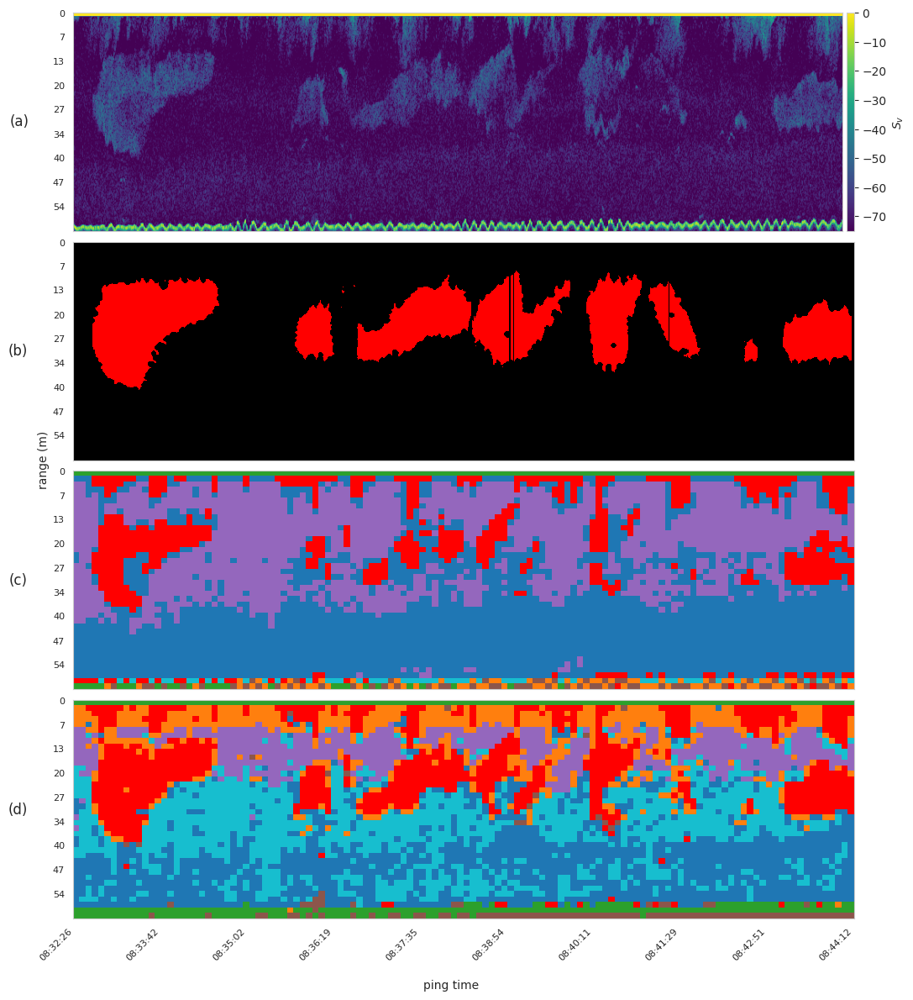

In [21]:

from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors

colors_cluster4 = ['red', 'tab:blue', 'tab:green', 'tab:orange', 'tab:purple', 'tab:cyan', 'tab:brown']  # Red for Cluster 4
cmap_for_Sv = mcolors.ListedColormap(colors_cluster4)

colors_cluster5 = ['tab:purple', 'tab:blue', 'tab:brown', 'tab:orange', 'tab:green', 'tab:cyan', 'red']  # Red for Cluster 5
cmap_for_SSL = mcolors.ListedColormap(colors_cluster5)

colors_cluster6 = ['black', 'red', 'red']  # Red for Cluster 5
cmap_for_Annot = mcolors.ListedColormap(colors_cluster6)

def visualize_data(ping_start_value, ping_end_value, range_start, range_end, num_clusters,
                   Sv_ayarlanmis_data, features_echogram, cmap_for_Sv, cmap_for_SSL, plot_Sv_clusters=True, savefig=False):
    # Applying k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    #kmeans = OPTICS(xi=0.0005, min_cluster_size=200, min_samples=5)
    #kmeans = DBSCAN(eps=0.5, min_samples=200, metric='minkowski', leaf_size=5, p=1)
    kmeans_classes = kmeans.fit_predict(features_echogram.iloc[:, 11:139])
    kmeans_Sv_original_classes = kmeans.fit_predict(np.array(Sv_ayarlanmis_data[:, 11:], dtype=np.float64))

    # Predicting Corresponding Patches
    knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean').fit(features_echogram.iloc[:100, 11:139], features_echogram.iloc[:100, 1])
    echogram_classes = knn.predict(features_echogram.iloc[:, 11:139])
    final_data = pd.concat \
        ([pd.DataFrame(kmeans_classes), pd.DataFrame(echogram_classes), pd.DataFrame(kmeans_Sv_original_classes), features_echogram.iloc[: ,3:5]], axis=1)
    final_data.columns = ['kmeans_cluster', 'class', 'k_means_Sv', 'center_y', 'center_x']

    additi = -10  # -150000
    patch_size = 8
    frequencies = [18, 38, 120, 200]

    ping_start = ((ping_start_value + additi + 8) // patch_size) * patch_size
    ping_end = ((ping_end_value + additi) // patch_size) * patch_size

    ping_slice = slice(ping_start, ping_end)
    range_slice = slice(range_start, range_end)

    yeni_array = final_data[
        (final_data['center_x'] > ping_start) &
        (final_data['center_x'] < ping_end) &
        (final_data['center_y'] < range_end)
        ]

    gercek_array = loaded_patch_data_array[
        (loaded_patch_data_array['center_x'] > ping_start) &
        (loaded_patch_data_array['center_x'] < ping_end) &
        (loaded_patch_data_array['center_y'] < range_end)
        ]

    yeni_array['center_x'] = yeni_array['center_x'] - yeni_array['center_x'].min() + patch_size // 2
    gercek_array['center_x'] = gercek_array['center_x'] - gercek_array['center_x'].min() + patch_size // 2

    dat1 = survey.ds.sv.isel(ping_time=ping_slice, range=range_slice).sel(frequency=frequencies)
    seabed = survey.get_seabed_mask(idx_ping=ping_start, n_pings=ping_end - ping_start, idx_range=range_start, n_range=range_end - range_start, return_numpy=False)
    labels = survey.get_label_slice(idx_ping=ping_start, n_pings=ping_end - ping_start, idx_range=range_start, n_range=range_end - range_start, drop_na=False, return_numpy=False, categories=survey.fish_categories)
    labels_values = labels.values

    labels_values[labels_values == 27.0] = 2.0
    labels_values[labels_values == 5027.0] = 4.0
    labels_values[labels_values == 6009.0] = 4.0

    modified = refine_label_boundary(ignore_zero_inside_bbox=False).__call__(dat1.values, labels_values, [1], [1])[1]
    modified[seabed == 1.0] = 0.0

    labels_from_patch_data = np.empty_like(modified, dtype=object)
    clusters_from_patch_data = np.empty_like(modified, dtype=object)
    clusters_Sv_from_patch_data = np.empty_like(modified, dtype=object)
    labels_from_gercek_patch_data = np.empty_like(modified, dtype=object)

    for cluster, label, cluster_Sv, center_y, center_x in np.array(yeni_array):
        start_x = max(0, center_x - patch_size // 2)
        end_x = min(modified.shape[0], center_x + patch_size // 2)
        start_y = max(0, center_y - patch_size // 2)
        end_y = min(modified.shape[1], center_y + patch_size // 2)

        labels_from_patch_data[start_x:end_x, start_y:end_y] = label
        clusters_from_patch_data[start_x:end_x, start_y:end_y] = cluster
        clusters_Sv_from_patch_data[start_x:end_x, start_y:end_y] = cluster_Sv

    for center_x_gercek, center_y_gercek, label_gercek, _, _, _, _, _ in gercek_array:
        start_x = max(0, center_x_gercek - patch_size // 2)
        end_x = min(modified.shape[0], center_x_gercek + patch_size // 2)
        start_y = max(0, center_y_gercek - patch_size // 2)
        end_y = min(modified.shape[1], center_y_gercek + patch_size // 2)

        labels_from_gercek_patch_data[start_x:end_x, start_y:end_y] = label_gercek

    transposed_modified = modified.T
    transposed_labels = labels_from_patch_data.T
    transposed_gercek_labels = labels_from_gercek_patch_data.T
    transposed_clusters_from_patch_data = clusters_from_patch_data.T
    transposed_clusters_Sv_from_patch_data = clusters_Sv_from_patch_data.T

    transposed_labels[transposed_labels == None] = 'ignore'
    transposed_clusters_from_patch_data[transposed_clusters_from_patch_data == None] = num_clusters + 1
    transposed_clusters_Sv_from_patch_data[transposed_clusters_Sv_from_patch_data == None] = num_clusters + 1
    
    
    # Extract ping_time values from dat1
    ping_times = np.array(dat1['ping_time']).astype('datetime64[s]')  
    ping_times_str = np.datetime_as_string(ping_times, unit='s') 
    ping_times_str = [x[-8:] for x in ping_times_str] 
    
    ranges = ["{:.0f}".format(value) for value in dat1['range'].values]
    
    num_ticks = 10
    tick_indices_y = np.linspace(0, len(ranges) - 1, num_ticks, dtype=int)[:-1] 
    tick_indices_x = np.linspace(0, len(ping_times_str) - 1, num_ticks, dtype=int)

    fig, ax = plt.subplots(3 +plot_Sv_clusters, 1, figsize=(12, 14), sharex=True)

    im0 = ax[0].imshow(db_with_limits(dat1[3].T.values, 1, 2, frequencies)[0], cmap='viridis', aspect="auto")
    ax[0].text(-0.07, 0.5, '(a)', fontsize=12, va='center', ha='center', transform=ax[0].transAxes) 
    divider0 = make_axes_locatable(ax[0])
    cax0 = divider0.append_axes("right", size="1%", pad=0.05)
    cbar0 = plt.colorbar(im0, cax=cax0, label='$S_v$')    
    ax[0].set_yticks(tick_indices_y)
    ax[0].set_yticklabels([ranges[i] for i in tick_indices_y], fontsize=8)

    im1 = ax[1].imshow(transposed_modified, aspect="auto", cmap=cmap_for_Annot)
    ax[1].text(-0.07, 0.5, '(b)', fontsize=12, va='center', ha='center', transform=ax[1].transAxes)
    #divider1 = make_axes_locatable(ax[1])
    #cax1 = divider1.append_axes("right", size="1%", pad=0.05)
    #cbar1 = plt.colorbar(im1, cax=cax1, ticks=[0, 1, 2, 4], label='Pixel class')
    #cbar1.set_ticklabels(['bg', 'ot', 'sd', 'ignore'])
    ax[1].set_yticks(tick_indices_y)
    ax[1].set_yticklabels([ranges[i] for i in tick_indices_y], fontsize=8)

    if plot_Sv_clusters:
        im2 = ax[2].imshow(transposed_clusters_Sv_from_patch_data.astype(float), aspect="auto",
                           interpolation='nearest', cmap=cmap_for_Sv)
        ax[2].text(-0.07, 0.5, '(c)', fontsize=12, va='center', ha='center', transform=ax[2].transAxes)
        #divider2 = make_axes_locatable(ax[2])
        #cax2 = divider2.append_axes("right", size="1%", pad=0.05)
        #cbar2 = plt.colorbar(im2, cax=cax2, label='Cluster number')
        ax[2].set_yticks(tick_indices_y)
        ax[2].set_yticklabels([ranges[i] for i in tick_indices_y], fontsize=8)

    im3 = ax[2+plot_Sv_clusters].imshow(transposed_clusters_from_patch_data.astype(float), aspect="auto",
                                          interpolation='nearest', cmap=cmap_for_SSL)
    ax[2+plot_Sv_clusters].text(-0.07, 0.5, '(d)', fontsize=12, va='center', ha='center', transform=ax[2+plot_Sv_clusters].transAxes)
    #divider3 = make_axes_locatable(ax[ 2 +plot_Sv_clusters])
    #cax3 = divider3.append_axes("right", size="1%", pad=0.05)
    #cbar3 = plt.colorbar(im3, cax=cax3, label='Cluster number')
    ax[2+plot_Sv_clusters].set_yticks(tick_indices_y)
    ax[2+plot_Sv_clusters].set_yticklabels([ranges[i] for i in tick_indices_y], fontsize=8)
    
    # Set x-axis ticks and labels
    ax[-1].set_xticks(tick_indices_x)
    ax[-1].set_xticklabels([ping_times_str[i] for i in tick_indices_x], rotation=45, ha='right', fontsize=8)


    fig.text(0.5, 0.05, 'ping time', ha='center')
    fig.text(0.09, 0.5, 'range (m)', va='center', rotation='vertical')

    plt.subplots_adjust(hspace=0.05)
    if savefig: plt.savefig('echogram_painting_model_33_ping_1289700_plain_NEW', dpi=600, bbox_inches='tight')
    plt.show()

# Example usage:
ping_start_value = 1289700 #1289700
ping_end_value = 1290700 #1290700
range_start = 0
range_end = 320
num_clusters = 7
Sv_ayarlanmis_data = Sv_ayarlanmis_data
features_echogram = features_echogram


visualize_data(ping_start_value, ping_end_value,
               range_start, range_end, num_clusters, Sv_ayarlanmis_data,
               features_echogram, cmap_for_Sv, cmap_for_SSL, plot_Sv_clusters=True, savefig=True)


In [ ]:
import matplotlib.colors as mcolors

colors_cluster4 = ['black', 'blue', 'green', 'red', 'red', 'cyan', 'magenta'] 
cmap_cluster4 = mcolors.ListedColormap(colors_cluster4)

colors_cluster5 = ['black', 'blue', 'green', 'cyan', 'red', 'red', 'magenta']
cmap_cluster5 = mcolors.ListedColormap(colors_cluster5)

# Example usage:
ping_start_value = 1289700 #1289700
ping_end_value = 1290700 #1290700
range_start = 0
range_end = 320
num_clusters = 7
Sv_ayarlanmis_data = Sv_ayarlanmis_data
features_echogram = features_echogram

visualize_data(ping_start_value, ping_end_value,
               range_start, range_end, num_clusters, Sv_ayarlanmis_data,
               features_echogram, cmap_cluster4, plot_Sv_clusters=True, savefig=False)

visualize_data(ping_start_value, ping_end_value,
               range_start, range_end, num_clusters, Sv_ayarlanmis_data,
               features_echogram, cmap_cluster5, plot_Sv_clusters=True, savefig=False)


# Predicting Sv sum for Sandeel

In [23]:
import pickle
with open(f'/scratch/disk5/ahmet/data/8w_Test_9Years/list_undersampled_2017_8w_.pkl', "rb") as f:
    data_list = pickle.load(f)
    data_list['center_coordinates'] = np.array(data_list['center_coordinates']).T # Fixing inconsistency

with open('/scratch/disk5/ahmet/data/8w_Test_2017/list_undersampled_2017_ANNOTATIONS_8w_.pkl', "rb") as f:
    annotation_list = pickle.load(f)
# Model 33
features = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Undersampled_Patch_Array_Features/Model33_2017_8w.csv', header=None, sep=r',|\t', engine='python')

annotations = annotation_list['data']


flattened_shape = annotations.shape 


num_samples = flattened_shape[0] // (5) 
array_annotations = annotations.reshape((num_samples, 5, 8, 8))
sandeel_channel = array_annotations[:,2,:,:]

sv_data_4_channels = data_list['data']

In [24]:

sum_values_for_instances = np.zeros((127119, 4))


for i in range(127119):
    masked_data_instance = sv_data_4_channels[i] * sandeel_channel[i][:, :]
    

    summed_channels_instance = np.sum(masked_data_instance, axis=(1, 2))
    

    sum_values_for_instances[i] = summed_channels_instance
    
features.iloc[:,0:4] = sum_values_for_instances

def process_data(features):
    features[5].replace({'other_seabed': 'other', 'sandeel_seabed': 'sandeel', 'seabed': 'background'}, inplace=True)
    features.reset_index(drop=True, inplace=True)


    value = min(features[5].value_counts().get('other', 0), features[5].value_counts().get('sandeel', 0))


    np.random.seed(1)
    features = features.groupby(5, group_keys=False).apply(lambda x: x.sample(min(value, len(x)), replace=False))

    filtered_df = features[~features[5].isin(['other_seabed', 'sandeel_seabed', 'sandeel_other', 'sandeel_other_seabed'])]
    features = filtered_df.reset_index(drop=True)
    features.dropna(inplace=True)
    features = features.reset_index(drop=True)
    return features

features = process_data(features)
features

,0,1,2,3,4,5,6,7,8,9,...,130,131,132,133,134,135,136,137,138,139
0,0.000000,0.000000,0.000000,0.000000,683660,background,0,0,0,-70.413610,...,0.000000,0.003621,0.000000,0.000000,0.002938,0.032035,0.044003,0.075422,0.017981,del
1,0.000000,0.000000,0.000000,0.000000,755476,background,0,0,37,-44.470948,...,0.052866,0.007199,0.053491,0.004992,0.000000,0.000000,0.023081,0.037677,0.027924,del
2,0.000000,0.000000,0.000000,0.000000,531860,background,0,0,2,-74.653352,...,0.000000,0.000000,0.082142,0.000000,0.006993,0.074359,0.000000,0.000000,0.027510,del
3,0.000000,0.000000,0.000000,0.000000,55588,background,0,0,12,-67.204659,...,0.001133,0.000203,0.212391,0.033237,0.013005,0.018449,0.020335,0.021981,0.003074,del
4,0.000000,0.000000,0.000000,0.000000,1431444,background,0,0,2,-71.070074,...,0.000000,0.000000,0.030912,0.028473,0.027007,0.019639,0.000000,0.032856,0.000000,del
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41413,-4535.099753,-4040.652072,-4250.231176,-4273.932350,1286588,sandeel,0,64,0,-66.796544,...,0.029293,0.000000,0.003051,0.252419,0.000000,0.027205,0.005307,0.274061,0.020301,del
41414,-4794.110187,-4601.693588,-4527.463763,-4530.479702,627308,sandeel,0,64,0,-72.084950,...,0.000000,0.000000,0.020044,0.014830,0.000000,0.055378,0.000000,0.008620,0.004676,del
41415,-4346.546568,-3815.287495,-3939.967973,-3968.966934,77900,sandeel,0,64,0,-62.776441,...,0.150133,0.000000,0.000348,0.341466,0.000000,0.029822,0.021192,0.313375,0.014049,del
41416,-4733.264005,-4632.350165,-4429.170263,-4538.839402,677164,sandeel,0,54,0,-71.615718,...,0.006767,0.000000,0.053396,0.061307,0.000000,0.044998,0.007807,0.062014,0.053583,del


Root Mean Squared Error (RMSE) on the test set: 968.74
R-squared on the test set: 0.59
Mean Absolute Error (MAE) on the test set: 652.78


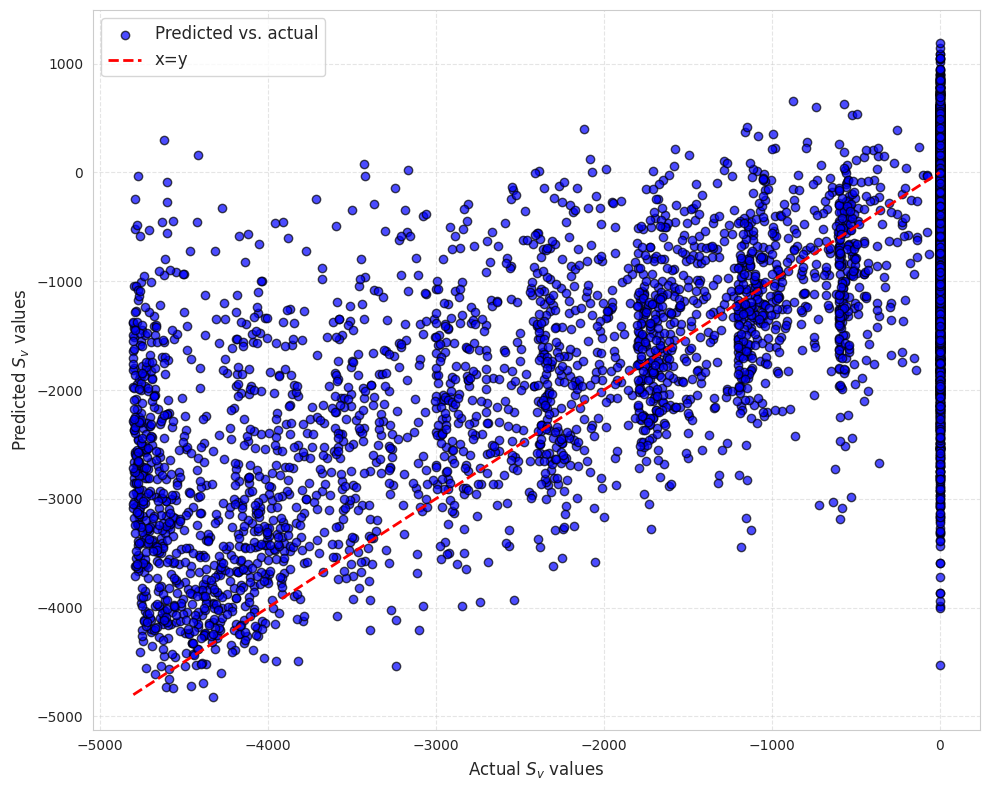

In [25]:
# Linear Classifier on Mean Sv


# Separate features and labels
X = features.iloc[:, 11:139] 
y = features.iloc[:, 0]   


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42) #, stratify=y

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
#y_pred = np.maximum(y_pred, 0)


rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE) on the test set: {rmse:.2f}')

r2 = r2_score(y_test, y_pred)
print(f'R-squared on the test set: {r2:.2f}')

mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE) on the test set: {mae:.2f}')

plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs. actual', color='blue', marker='o', edgecolors='black') 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y') 

plt.xlabel('Actual $S_v$ values', fontsize=12)
plt.ylabel('Predicted $S_v$ values', fontsize=12) 
plt.legend(fontsize=12) 
plt.grid(True, linestyle='--', alpha=0.5) 
plt.tight_layout() 
plt.savefig('Predicted_vs_Actual_Sv_model33',dpi=600)
plt.show()


Root Mean Squared Error (RMSE) on the test set: 1028.56
R-squared on the test set: 0.50
Mean Absolute Error (MAE) on the test set: 777.03


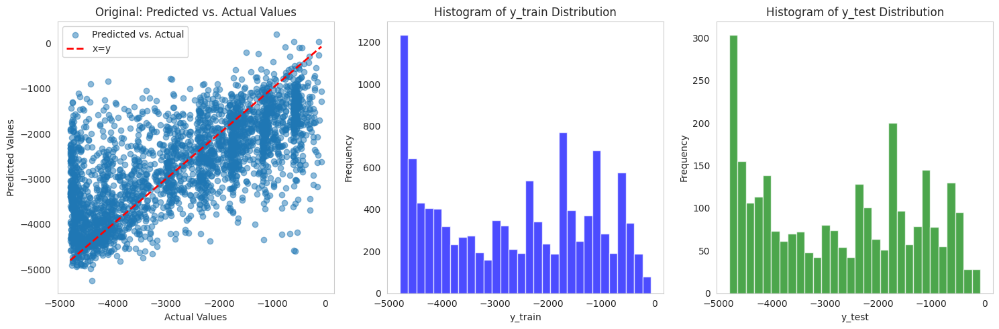

In [26]:

np.random.seed(42)


X = features.iloc[:, 11:139]
y = features.iloc[:, 0] 


zero_indices = y[y == 0].index

random_indices = np.random.choice(zero_indices, size=0, replace=False)

non_zero_indices = y[y != 0].index

selected_indices = np.concatenate([random_indices, non_zero_indices])

X_selected = X.loc[selected_indices]
y_selected = y.loc[selected_indices]

X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.20, random_state=42)

#y_train = np.log10(y_train+1)
#y_test = np.log10(y_test+1)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

#y_pred = np.maximum(y_pred, 0)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE) on the test set: {rmse:.2f}')

r2 = r2_score(y_test, y_pred)
print(f'R-squared on the test set: {r2:.2f}')

mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE) on the test set: {mae:.2f}')

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred, alpha=0.5, label='Predicted vs. Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2, label='x=y')
plt.title('Original: Predicted vs. Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

plt.subplot(1, 3, 2)
plt.hist(y_train, bins=30, color='blue', alpha=0.7)
plt.title('Histogram of y_train Distribution')
plt.xlabel('y_train')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(y_test, bins=30, color='green', alpha=0.7)
plt.title('Histogram of y_test Distribution')
plt.xlabel('y_test')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [27]:
features.iloc[:,0:5].shape

(41418, 5)

In [28]:
IB_2 = np.load('/scratch/disk5/ahmet/data/8w_Sampled_Data_9Years/Intensity_Based2/data_8w_IntensityBased2FIXED_16Batch_200Ep_100Iter_320000_FIXED.npy')
IB_3 = np.load('/scratch/disk5/ahmet/data/8w_Sampled_Data_9Years/Intensity_Based3/data_8w_IntensityBased3_16Batch_200Ep_100Iter_320000.npy')
IB_4 = np.load('/scratch/disk5/ahmet/data/8w_Sampled_Data_9Years/Intensity_Based4/data_8w_IntensityBased4_16Batch_200Ep_100Iter_320000.npy')

In [29]:
IB_2.shape

(320000, 4, 8, 8)

In [30]:
IB_3.shape

(320000, 4, 8, 8)

In [31]:
np.isnan(IB_4).sum()

0

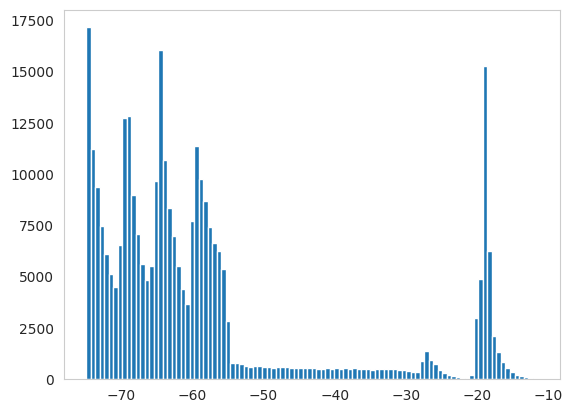

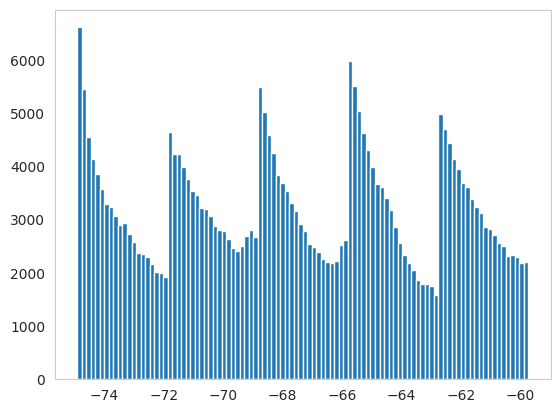

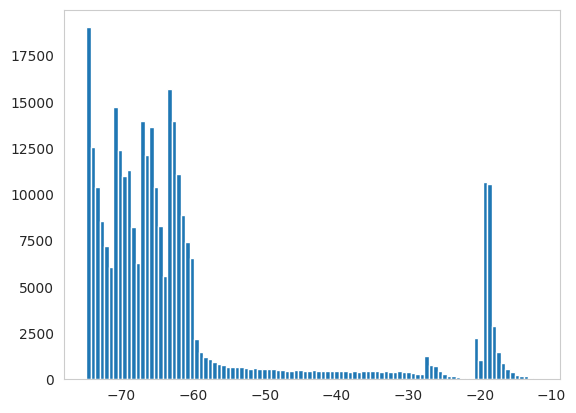

In [32]:
plt.hist(IB_2.mean(axis=(1,2,3)), bins=100)
plt.show()

plt.hist(IB_3.mean(axis=(1,2,3)), bins=100)
plt.show()

plt.hist(IB_4.mean(axis=(1,2,3)), bins=100)
plt.show()